In [2]:
import pandas as pd
import numpy as np
from numpy import mean, std, absolute
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.multioutput import MultiOutputRegressor
from sklearn.ensemble import RandomForestRegressor, BaggingRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression, Ridge, LassoLarsIC, BayesianRidge, PoissonRegressor
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
import xgboost as xg
import scipy as sp
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error as mse

plt.style.use('ggplot')

In [3]:
data = pd.read_excel('Data/Gasification Data_Daya.xlsx', index_col=0, header=0)
data = data.iloc[1:223,:14] 
display(list(data.columns.values))

# Drop null balues and store dataframe in dataframe 2
data=data.dropna()
print(data)

#Check Null values again after removing
print(data.isnull().values.any())
print(data.isna().values.any())

X = data.iloc[:, :9]
y = data.iloc[:, 9:]

input_columns = list(X.columns.values)
output_columns = list(y.columns.values)

print(X.shape, y.shape)

['C [%wt db]',
 'H [%wt db]',
 'O [%wt db]',
 'Moisture [%wt]',
 'Ash [%wt db]',
 'ER [-]',
 'T [ºC]',
 'Bed material',
 'Steam/Biomass',
 'H2 [%vol N2 free]',
 'CO [%vol N2 free]',
 'CO2 [%vol N2 free]',
 'CH4 [%vol N2 free]',
 'GY [Nm3/kg daf]']

        C [%wt db] H [%wt db]  O [%wt db] Moisture [%wt]  Ash [%wt db]  \
Sr No.                                                                   
2            50.00        5.7       44.10             21          0.85   
3            50.00        5.7       44.10             23          0.85   
4            50.00        5.7       44.10             22          0.85   
5            50.00        5.7       44.10             25          0.85   
6            50.00        5.7       44.10             19          0.85   
...            ...        ...         ...            ...           ...   
219          46.85        6.3       45.55              9          1.30   
220          46.85        6.3       45.55              9          1.30   
221          46.76       5.68       39.46           9.94          8.10   
222          46.76       5.68       39.46           9.94          8.10   
223          46.76       5.68       39.46           9.94          8.10   

        ER [-]  T [ºC]  Bed material 

## Feature selection using Correlation based Feature Selection

In [13]:
data = np.array(X)

best_features = {}
X_reduced = {}
for out in range(len(output_columns)):
    target = np.array(y.iloc[:, out])
    # configure to select all features
    fs = SelectKBest(score_func=f_regression, k='all')
    # learn relationship from training data
    fs.fit(data, target)
    best_features[out]=np.argsort(fs.scores_)
    print(best_features[out])
    # transform train input data
    X_train_fs = fs.transform(data)[:, best_features[out]]
    X_reduced[out] = X_train_fs[:,:3]
    print(data.shape, X_reduced[out].shape)
    

  # what are scores for the features
#   for i in range(len(fs.scores_)):
# 	  print('Feature %d: %f' % (i, fs.scores_[i]))
#     # plot the scores
#   pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
#   # pyplot.xlabel(rotation=90)
#   pyplot.show()

[7 4 6 8 5 3 2 0 1]
(187, 9)
(187, 9) (187, 3)
[1 5 3 0 6 7 8 4 2]
(187, 9)
(187, 9) (187, 3)
[7 6 4 2 8 3 5 0 1]
(187, 9)
(187, 9) (187, 3)
[4 8 5 7 2 6 3 0 1]
(187, 9)
(187, 9) (187, 3)
[8 4 7 5 3 6 0 1 2]
(187, 9)
(187, 9) (187, 3)


## Correlation analysis

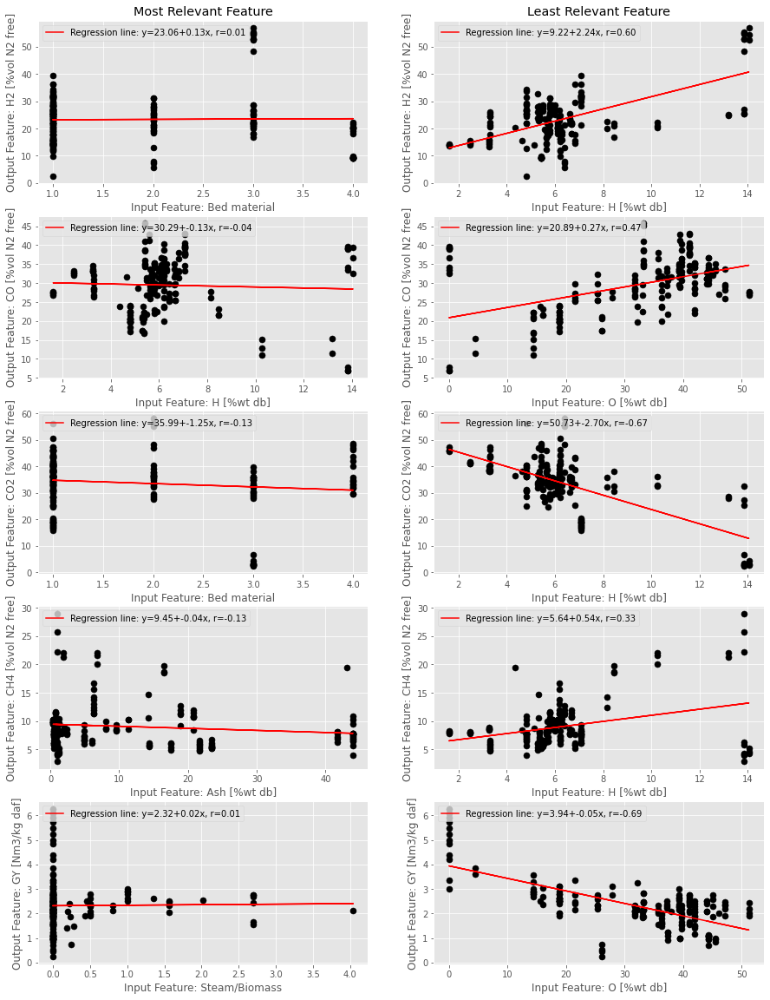

In [15]:
## Correlation analysis for best feature
plt.figure(figsize=(15, 20))
for odx, out in enumerate(output_columns):
    best_feature_indice = best_features[odx][0]   
    plt.subplot(5, 2, 2*odx +1)
    plt.scatter(X[input_columns[best_feature_indice]], y[out], s=50, color='black')
    slope, intercept, r, p, stderr = sp.stats.linregress(X[input_columns[best_feature_indice]].astype(float), 
                                                         y[out].astype(float))
    line = f'Regression line: y={intercept:.2f}+{slope:.2f}x, r={r:.2f}'
    plt.plot(X[input_columns[best_feature_indice]], intercept + slope * X[input_columns[best_feature_indice]], 
             label=line, color='red')
    plt.xlabel("Input Feature: %s" % input_columns[best_feature_indice])
    plt.ylabel("Output Feature: %s" % out)
    if odx==0:
        plt.title("Most Relevant Feature")
    plt.legend(loc='upper left')
    
    plt.subplot(5, 2, 2*odx +2)
    worst_feature_indice = best_features[odx][-1]   
    plt.scatter(X[input_columns[worst_feature_indice]], y[out], s=50, color='black')
    slope, intercept, r, p, stderr = sp.stats.linregress(X[input_columns[worst_feature_indice]].astype(float), 
                                                         y[out].astype(float))
    line = f'Regression line: y={intercept:.2f}+{slope:.2f}x, r={r:.2f}'
    plt.plot(X[input_columns[worst_feature_indice]], intercept + slope * X[input_columns[worst_feature_indice]], 
             label=line, color='red')
    plt.xlabel("Input Feature: %s" % input_columns[worst_feature_indice])
    plt.ylabel("Output Feature: %s" % out)
    if odx == 0:
        plt.title("Least Relevant Feature")
    plt.legend(loc='upper left')
plt.savefig('Figures/MISO_corr/Correlation_analysis.pdf')

## Regression Analysis

In [16]:
# constants
methods = ['Linear', 'Ridge', 'LARS', 'RF', 'Bag', 'GradientBoost']
number_of_folds = 11
ridge_reg = [1.0, 10.0, 100.0, 1000.0, 1e6]
n_estimators = [10, 50, 100, 500, 1000]
learning_rate = [1e-3, 0.01, 0.1, 1]
max_depth = 30

methods_extended = []
for met in methods:
    if met == 'Linear' or met == 'LARS':
        methods_extended.append(met)
    elif met == 'Ridge':
        for reg in ridge_reg:
            methods_extended.append(met + '_Reg_' + str(reg))
    elif met == 'RF':
        for rfest in n_estimators:
            methods_extended.append(met + '_est_' + str(rfest))
    elif met == 'Bag':
        for best in n_estimators:
            methods_extended.append(met + '_est_' + str(best))
    elif met == 'GradientBoost':
        for gbest in n_estimators:
            for lr in learning_rate:
                methods_extended.append(met + '_est_' + str(gbest) + 
                                        '_lr_' + str(lr))
print(methods_extended)

['Linear', 'Ridge_Reg_1.0', 'Ridge_Reg_10.0', 'Ridge_Reg_100.0', 'Ridge_Reg_1000.0', 'Ridge_Reg_1000000.0', 'LARS', 'RF_est_10', 'RF_est_50', 'RF_est_100', 'RF_est_500', 'RF_est_1000', 'Bag_est_10', 'Bag_est_50', 'Bag_est_100', 'Bag_est_500', 'Bag_est_1000', 'GradientBoost_est_10_lr_0.001', 'GradientBoost_est_10_lr_0.01', 'GradientBoost_est_10_lr_0.1', 'GradientBoost_est_10_lr_1', 'GradientBoost_est_50_lr_0.001', 'GradientBoost_est_50_lr_0.01', 'GradientBoost_est_50_lr_0.1', 'GradientBoost_est_50_lr_1', 'GradientBoost_est_100_lr_0.001', 'GradientBoost_est_100_lr_0.01', 'GradientBoost_est_100_lr_0.1', 'GradientBoost_est_100_lr_1', 'GradientBoost_est_500_lr_0.001', 'GradientBoost_est_500_lr_0.01', 'GradientBoost_est_500_lr_0.1', 'GradientBoost_est_500_lr_1', 'GradientBoost_est_1000_lr_0.001', 'GradientBoost_est_1000_lr_0.01', 'GradientBoost_est_1000_lr_0.1', 'GradientBoost_est_1000_lr_1']


In [17]:
kf = KFold(n_splits=number_of_folds, random_state=number_of_folds, shuffle=True)

prediction = {}
error = {}
for met in methods_extended:
    print(met)
    score = {}
    prediction[met] = np.zeros_like(y) 
    
    string_extract = met.split('_')
    
    for idx in range(y.shape[1]):
        for fold, (train, test) in enumerate(kf.split(y)):
            training_x = np.asarray(X_reduced[idx])[train]
            testing_x = np.asarray(X_reduced[idx])[test]
            training_y = np.asarray(y)[train, idx]
            testing_y = np.asarray(y)[test, idx]

            if string_extract[0] == 'Linear':
                regr_multilin = LinearRegression()
                regr_multilin.fit(training_x, training_y)
                score[fold] = regr_multilin.predict(testing_x)

            elif string_extract[0] == 'Ridge':
                regr_multiridge = Ridge(alpha=float(string_extract[-1]))
                regr_multiridge.fit(training_x, training_y)
                score[fold] = regr_multiridge.predict(testing_x)

            elif string_extract[0] == 'LARS':
                regr_multilasso = LassoLarsIC()
                regr_multilasso.fit(training_x, training_y)
                score[fold] = regr_multilasso.predict(testing_x)

            elif string_extract[0] == 'RF':
                regr_multirf = RandomForestRegressor(n_estimators=int(string_extract[-1]),
                                                                      max_depth=max_depth,
                                                                      random_state=0)
                regr_multirf.fit(training_x, training_y)
                score[fold] = regr_multirf.predict(testing_x)

            elif string_extract[0] == 'Bag':
                regr_multibag = BaggingRegressor(n_estimators=int(string_extract[-1]),
                                                                      random_state=0)
                regr_multibag.fit(training_x, training_y)
                score[fold] = regr_multibag.predict(testing_x)

            elif string_extract[0] == 'GradientBoost':
                regr_multigb = GradientBoostingRegressor(n_estimators=int(string_extract[-3]), 
                                                                              learning_rate=float(string_extract[-1]),
                                                                              random_state=0, loss='huber')
                regr_multigb.fit(training_x, training_y)
                score[fold] = regr_multigb.predict(testing_x)

        for (train, test), fold in zip(kf.split(y), list(range(number_of_folds))):
            prediction[met][test, idx] = score[fold]
    
    error[met] = np.sqrt(mse(y, prediction[met], multioutput='raw_values'))

Linear
Ridge_Reg_1.0
Ridge_Reg_10.0
Ridge_Reg_100.0
Ridge_Reg_1000.0
Ridge_Reg_1000000.0
LARS
RF_est_10
RF_est_50
RF_est_100
RF_est_500
RF_est_1000
Bag_est_10
Bag_est_50
Bag_est_100
Bag_est_500
Bag_est_1000
GradientBoost_est_10_lr_0.001
GradientBoost_est_10_lr_0.01
GradientBoost_est_10_lr_0.1
GradientBoost_est_10_lr_1
GradientBoost_est_50_lr_0.001
GradientBoost_est_50_lr_0.01
GradientBoost_est_50_lr_0.1
GradientBoost_est_50_lr_1
GradientBoost_est_100_lr_0.001
GradientBoost_est_100_lr_0.01
GradientBoost_est_100_lr_0.1
GradientBoost_est_100_lr_1
GradientBoost_est_500_lr_0.001
GradientBoost_est_500_lr_0.01
GradientBoost_est_500_lr_0.1
GradientBoost_est_500_lr_1
GradientBoost_est_1000_lr_0.001
GradientBoost_est_1000_lr_0.01
GradientBoost_est_1000_lr_0.1
GradientBoost_est_1000_lr_1


## Plotting the result

<ipython-input-18-a865046d6852>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15, 30))


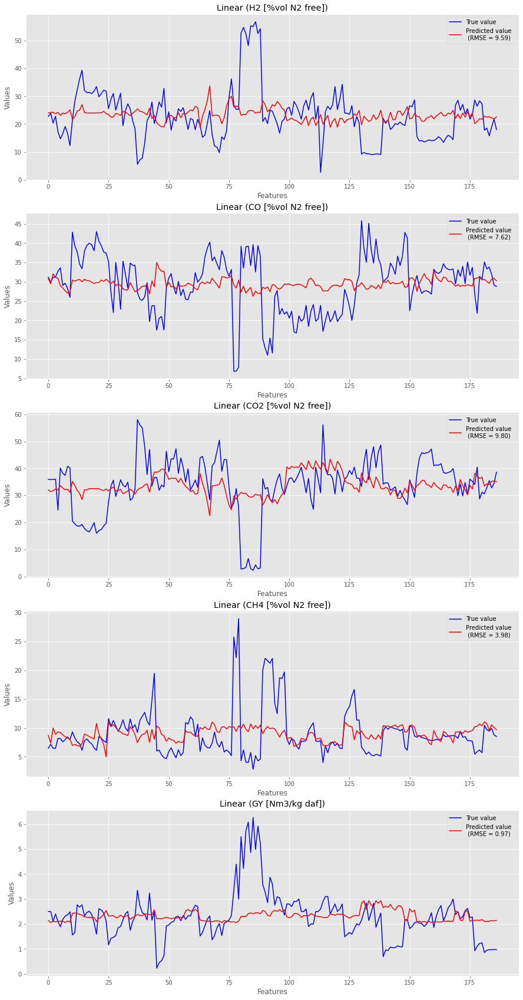

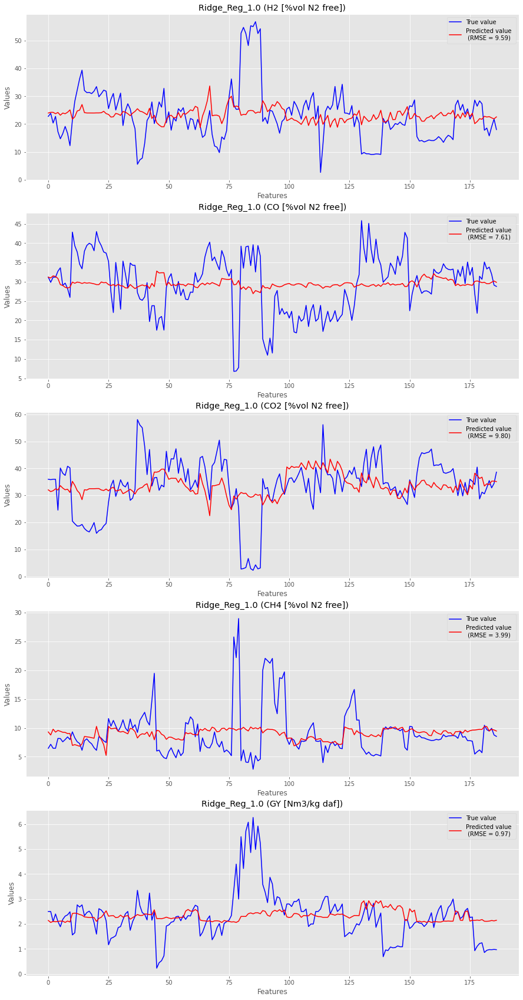

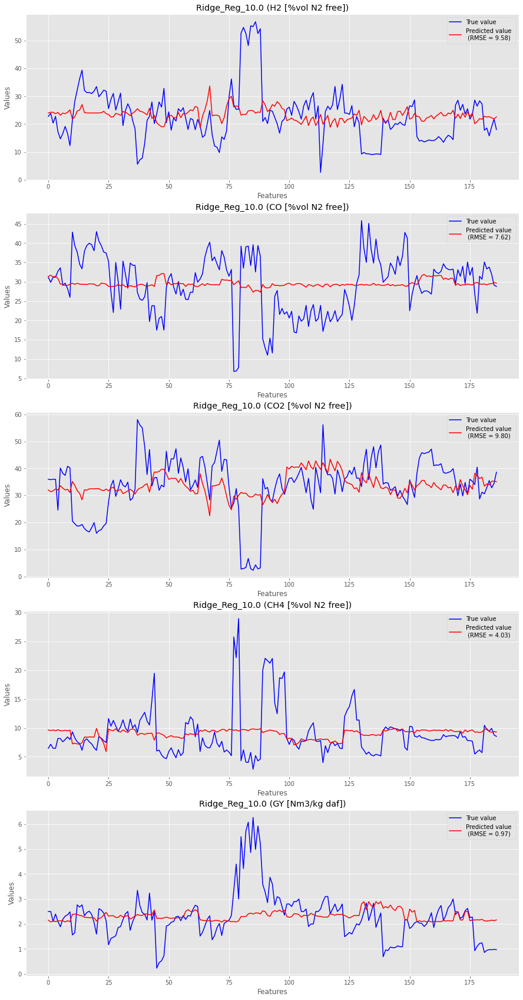

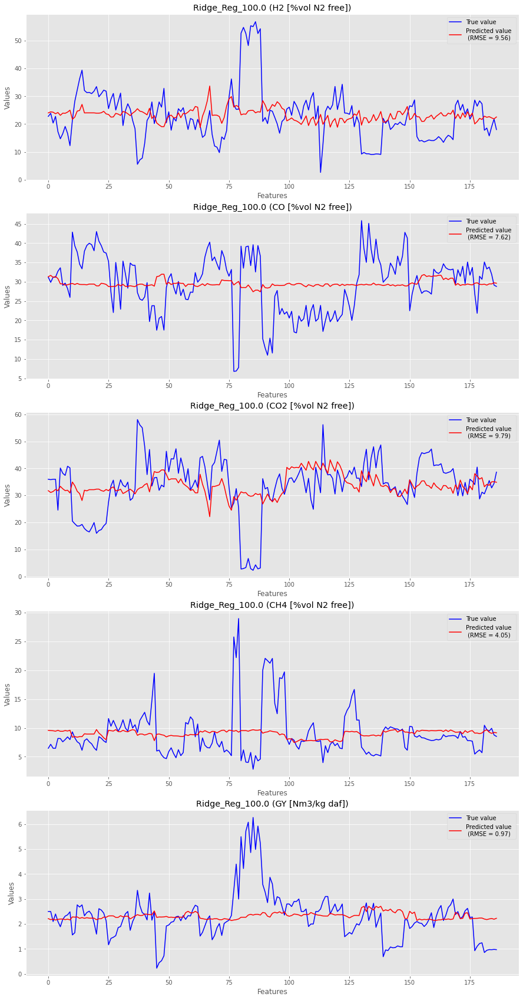

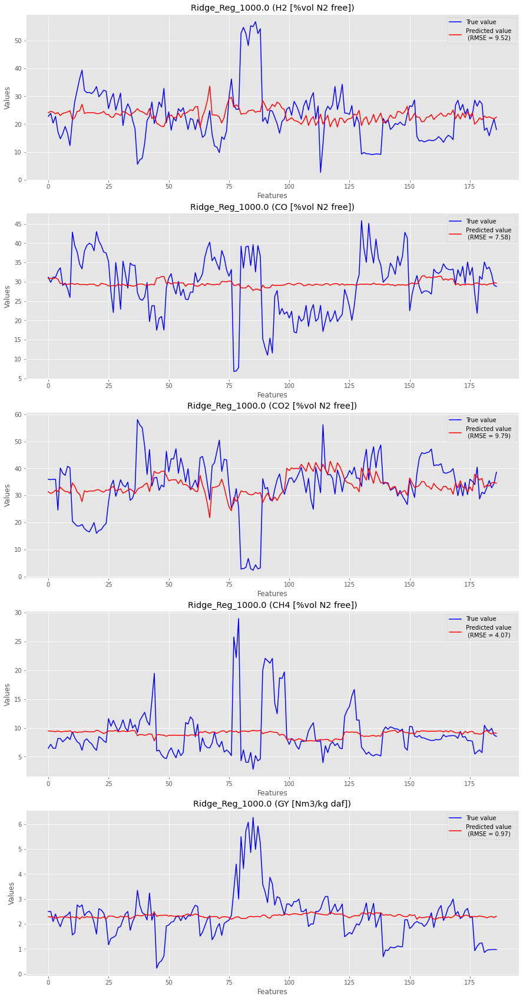

...

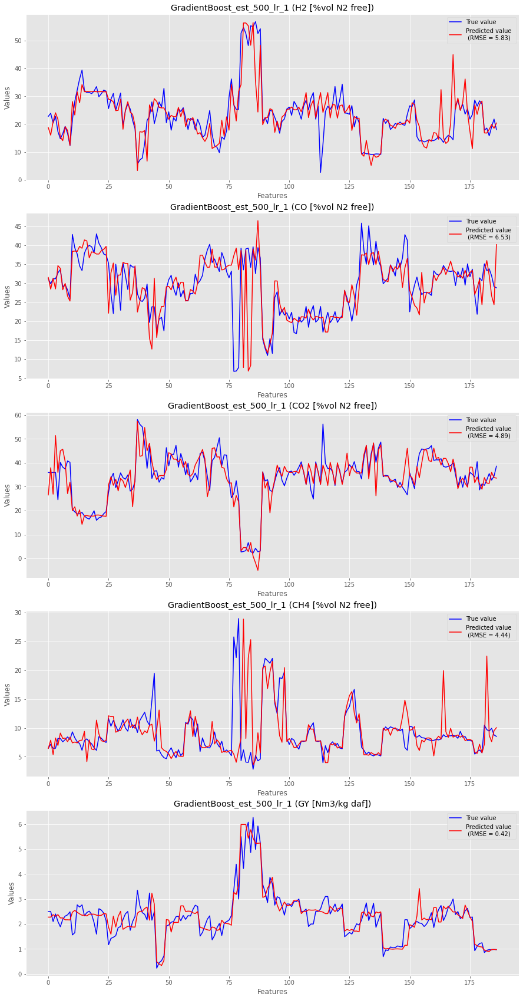

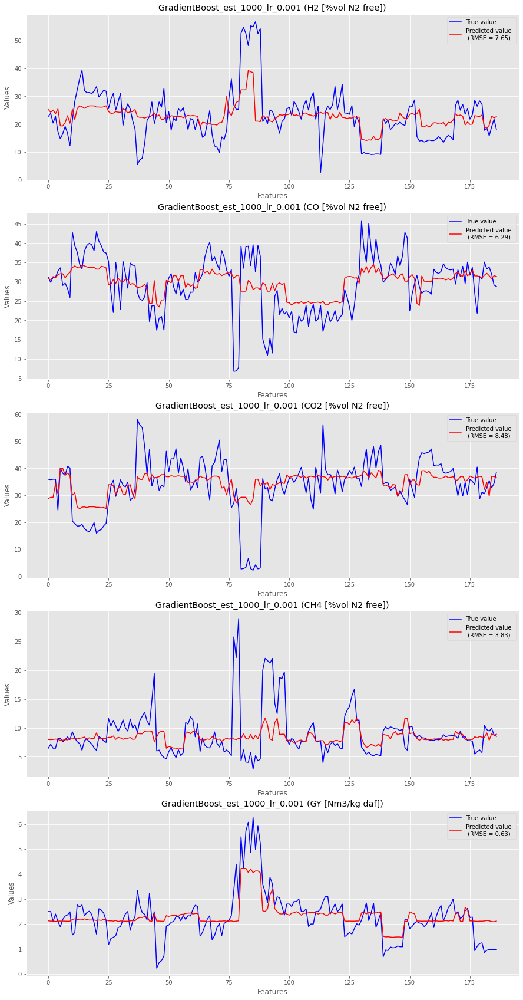

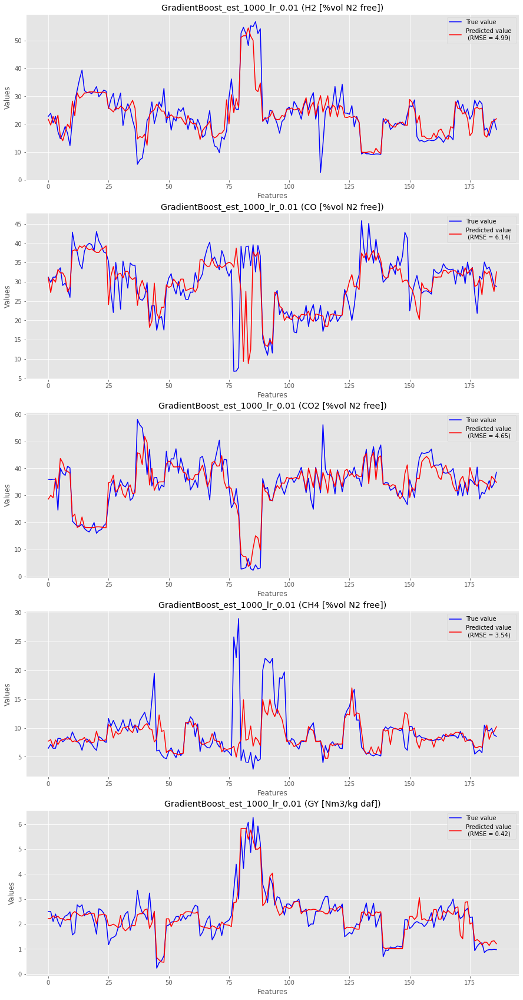

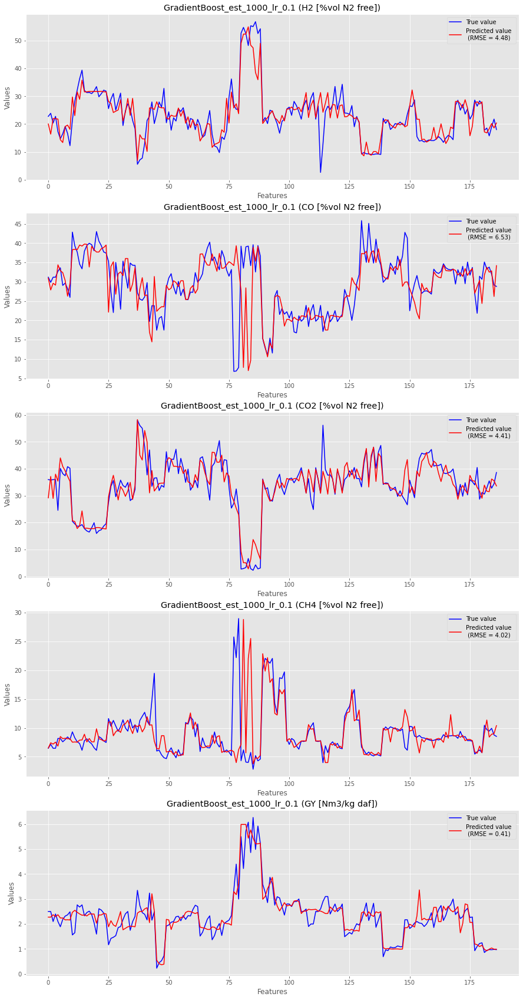

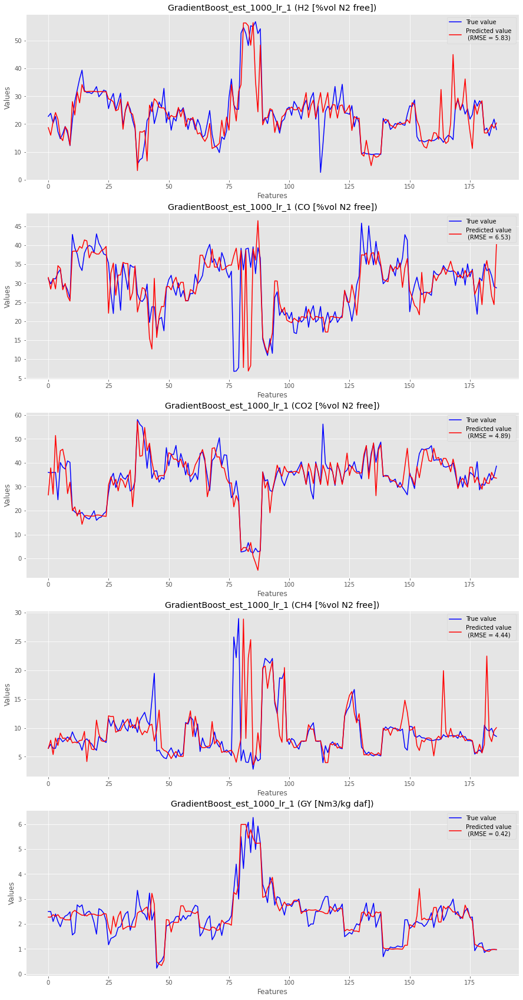

In [18]:
### Plot
for met in methods_extended:
    plt.figure(figsize=(15, 30))
    for odx, out in enumerate(output_columns):
        plt.subplot(5, 1, odx +1)
        plt.plot(np.asarray(y)[:, odx], label='True value', color='blue')
        plt.plot(np.asarray(prediction[met])[:, odx], color='red', 
                 label='Predicted value \n (RMSE = %.2f)' % error[met][odx])
        plt.xlabel("Features")
        plt.ylabel("Values")
        plt.title("%s (%s)" % (met, out))
        plt.legend()

    plt.savefig('Figures/MISO_corr/Prediction_%s.pdf' % met)